## Projekt 2 - Klasteryzacja
### Human Activity Recognition Using Smartphones Data Set
#### Milestone 2 - inżynieria cech, wstępne modelowanie

In [74]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.cm as cm
import itertools

from matplotlib import pyplot as plt

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples, calinski_harabasz_score

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from yellowbrick.cluster import SilhouetteVisualizer, silhouette_visualizer
from sklearn.cluster import AgglomerativeClustering

from scipy.cluster.hierarchy import dendrogram

import warnings
warnings.filterwarnings('ignore')

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

merged = pd.concat([train, test])
original_labels = merged['Activity']
X = merged.drop(['subject', 'Activity'], axis=1)

X.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [4]:
X.shape

(10299, 561)

Dane są już znormalizowane w przedziale $[-1,\, 1].$ Następnym naturalnie nasuwającym się pomysłem jest redukcja wymiarów.

## PCA
### Dobór `n_components`

In [36]:
pca = PCA(random_state=0)
pca.fit(X)

print('Ilość głównych składowych =', pca.n_components_)

Ilość głównych składowych = 561


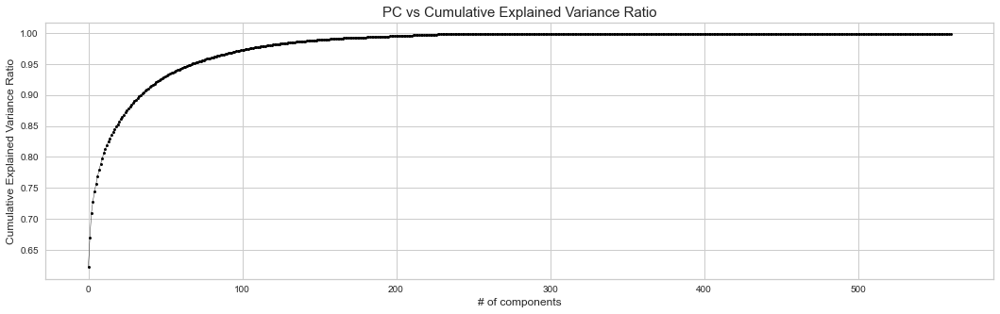

In [37]:
cum_var = np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4))

fig = plt.subplots(figsize=(18, 5))
plt.plot(cum_var, marker='o', color='black', ms=3, linewidth=0.4)

plt.title('PC vs Cumulative Explained Variance Ratio',fontsize=15)
plt.xlabel('# of components',fontsize=12)
plt.ylabel('Cumulative Explained Variance Ratio',fontsize=12)
plt.show()

Wygląda na to, że 95% wariancji może być wyjaśnione za pomocą około 75 składowych.

In [38]:
pca = PCA(n_components=0.95, random_state=0)
pca.fit(X)

print('Ilość głównych składowych =', pca.n_components_)

Ilość głównych składowych = 69


Nadal jest to sporo, można więc spróbować również mniejszą liczbę jak np. 90% wyjaśnionej wariancji.

In [45]:
pca2 = PCA(n_components=0.90, random_state=0)
pca2.fit(X)

print('Ilość głównych składowych =', pca2.n_components_)

Ilość głównych składowych = 36


# Modelowanie
## K-means

#### - PCA dla `n_components = 69` (95% EVR)

In [40]:
X_pca = pca.fit_transform(X)

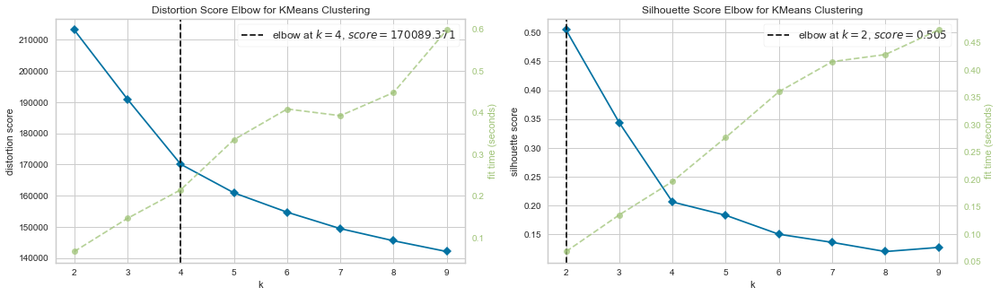

In [41]:
kmeans = KMeans()

fig, axes = plt.subplots(1, 2, figsize=(18, 5))

visualizer = KElbowVisualizer(kmeans, k=(2, 10), ax=axes[0])  
visualizer.fit(X_pca)     

visualizer.finalize() 

visualizer = KElbowVisualizer(kmeans, k=(2, 10), metric='silhouette', ax=axes[1])  
visualizer.fit(X_pca)     
  
visualizer.finalize() 

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10299 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(n_clusters=4, random_state=0))

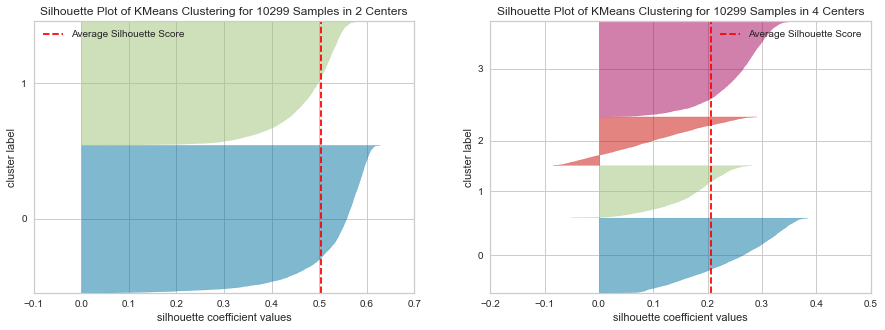

In [70]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

silhouette_visualizer(KMeans(n_clusters=2, random_state=0), X_pca, colors='yellowbrick', ax=axes[0], show=False)
silhouette_visualizer(KMeans(n_clusters=4, random_state=0), X_pca, colors='yellowbrick', ax=axes[1], show=False)

#### - PCA dla `n_components = 36` (90% EVR)

In [42]:
X_pca2 = pca2.fit_transform(X)

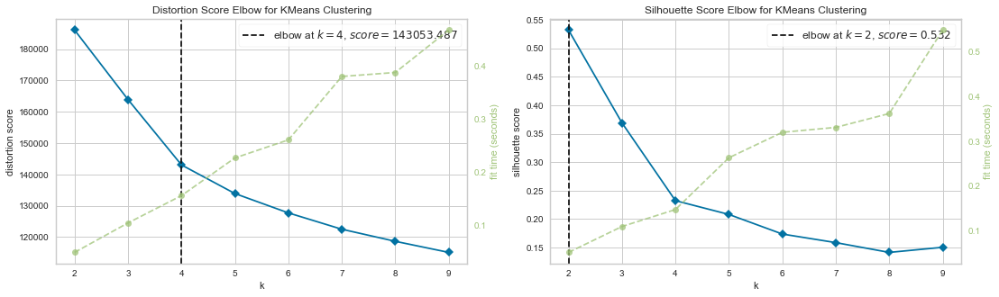

In [43]:
kmeans = KMeans()

fig, axes = plt.subplots(1, 2, figsize=(18, 5))

visualizer = KElbowVisualizer(kmeans, k=(2, 10), ax=axes[0])  
visualizer.fit(X_pca2)     

visualizer.finalize() 

visualizer = KElbowVisualizer(kmeans, k=(2, 10), metric='silhouette', ax=axes[1])  
visualizer.fit(X_pca2)     
  
visualizer.finalize() 

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10299 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(n_clusters=4, random_state=0))

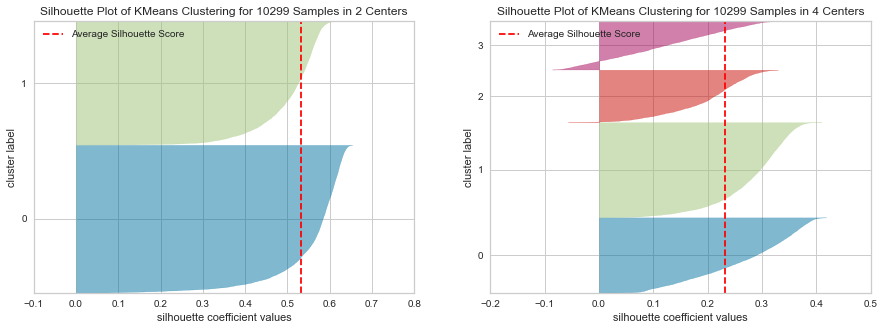

In [71]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

silhouette_visualizer(KMeans(n_clusters=2, random_state=0), X_pca2, colors='yellowbrick', ax=axes[0], show=False)
silhouette_visualizer(KMeans(n_clusters=4, random_state=0), X_pca2, colors='yellowbrick', ax=axes[1], show=False)

Nie widać zbyt dużych różnic można więc spróbwać czegoś bardziej ekstremalnego.

In [47]:
pca3 = PCA(n_components=0.8, random_state=0)
pca3.fit(X)

print('Ilość głównych składowych =', pca3.n_components_)

Ilość głównych składowych = 11


In [48]:
X_pca3 = pca3.fit_transform(X)

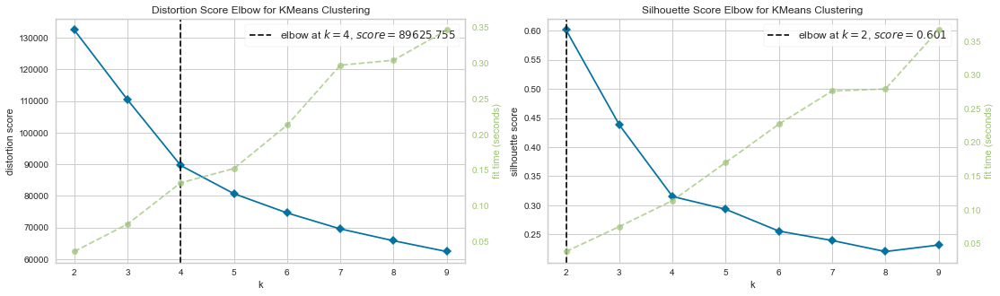

In [49]:
kmeans = KMeans()

fig, axes = plt.subplots(1, 2, figsize=(18, 5))

visualizer = KElbowVisualizer(kmeans, k=(2, 10), ax=axes[0])  
visualizer.fit(X_pca3)     

visualizer.finalize() 

visualizer = KElbowVisualizer(kmeans, k=(2, 10), metric='silhouette', ax=axes[1])  
visualizer.fit(X_pca3)     
  
visualizer.finalize() 

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10299 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(n_clusters=4, random_state=0))

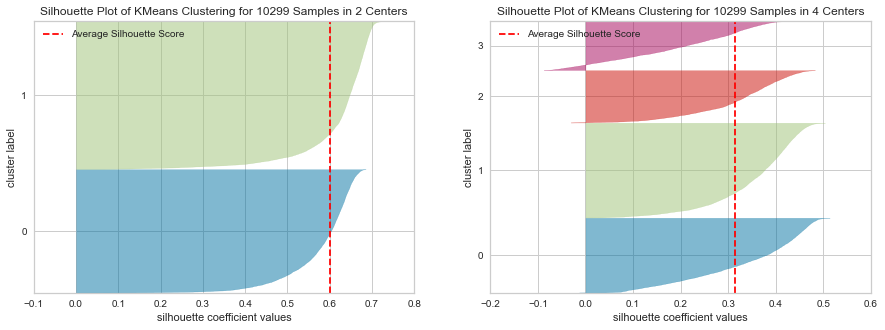

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

silhouette_visualizer(KMeans(n_clusters=2, random_state=0), X_pca3, colors='yellowbrick', ax=axes[0], show=False)
silhouette_visualizer(KMeans(n_clusters=4, random_state=0), X_pca3, colors='yellowbrick', ax=axes[1], show=False)

### Wyniki

In [63]:
metrices = {
    'silhouette': silhouette_score,
    'davies-bouldin': davies_bouldin_score,
    'calinski-harabasz': calinski_harabasz_score
}

models = {
    'Kmeans': KMeans
}

data = {
    'PCA 69 components (95%% EVA)': X_pca,
    'PCA 35 components (90%% EVA)': X_pca2,
    'PCA 11 components (80%% EVA)': X_pca3,
}

cluster_num = [2, 3, 4]

In [64]:
somelists = [data, models, cluster_num]

def count_clustering_scores(X, cluster_num, model, score_fun):
    if isinstance(cluster_num, int):
        cluster_num_iter = [cluster_num]
    else:
        cluster_num_iter = cluster_num
        
    scores = []    
    for k in cluster_num_iter:
        model_instance = model(n_clusters=k)
        labels = model_instance.fit_predict(X)
        wcss = score_fun(X, labels)
        scores.append(wcss)
    
    if isinstance(cluster_num, int):
        return scores[0]
    else:
        return scores

index =  pd.MultiIndex.from_tuples([x for x in itertools.product(*somelists)])

df = pd.DataFrame(index = index)

for row in index:
    for metric_key in metrices:
        df.loc[row, metric_key] = count_clustering_scores(X=data[row[0]], cluster_num=row[2],
                                                          model=models[row[1]],
                                                          score_fun=metrices[metric_key])

df

silhouette  davies-bouldin  \
PCA 69 components (95%% EVA) Kmeans 2    0.504670        0.792377   
                                    3    0.343645        1.550132   
                                    4    0.205911        1.892153   
PCA 35 components (90%% EVA) Kmeans 2    0.532132        0.736858   
                                    3    0.368533        1.423686   
                                    4    0.232126        1.727624   
PCA 11 components (80%% EVA) Kmeans 2    0.601402        0.609455   
                                    3    0.438506        1.115910   
                                    4    0.315000        1.333163   

                                       calinski-harabasz  
PCA 69 components (95%% EVA) Kmeans 2       15345.115308  
                                    3        9164.246446  
                                    4        7279.923484  
PCA 35 components (90%% EVA) Kmeans 2       17576.884533  
                                    3       10675.100356  
                                    4        8654.707260  
PCA 11 components (80%% EVA) Kmeans 2       24688.620887  
                                    3       15838.857531  
                                    4       13804.966476

- według metryki silhouette lepsze są dwa klastry oraz mniej komponentów.
- według metryki davies-bouldin lepsze są również dwa klastry jednak gdy jest więcej komponentów.
- według metryki calinski-harabasz także lepsze dwa klastry oraz mniej komponentów. <br />

Zatem wydaje się, że najoptymalniejsze może być `k = 2` oraz mała liczba składowych w PCA.

### Wizualizacja z użyciem t-SNE

In [ ]:
def plot_clustering(X, n_clusters, model):
    
    clustering = model(n_clusters=n_clusters)
    y = clustering.fit_predict(X)
    
    random_state = 4
    tSNE = TSNE(random_state=random_state, verbose=0)
    y_tsne = tSNE.fit_transform(X)
    
    plt.figure(figsize=(12, 12))
    sns.scatterplot(x=y_tsne[:, 0], y=y_tsne[:, 1], hue=y)
    plt.title(f'Clusters from {model.__name__} with {n_clusters} clusters')
    plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10299 samples in 0.028s...
[t-SNE] Computed neighbors for 10299 samples in 0.719s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10299
[t-SNE] Computed conditional probabilities for sample 2000 / 10299
[t-SNE] Computed conditional probabilities for sample 3000 / 10299
[t-SNE] Computed conditional probabilities for sample 4000 / 10299
[t-SNE] Computed conditional probabilities for sample 5000 / 10299
[t-SNE] Computed conditional probabilities for sample 6000 / 10299
[t-SNE] Computed conditional probabilities for sample 7000 / 10299
[t-SNE] Computed conditional probabilities for sample 8000 / 10299
[t-SNE] Computed conditional probabilities for sample 9000 / 10299
[t-SNE] Computed conditional probabilities for sample 10000 / 10299
[t-SNE] Computed conditional probabilities for sample 10299 / 10299
[t-SNE] Mean sigma: 0.641733
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.952484
[t-SNE] KL 

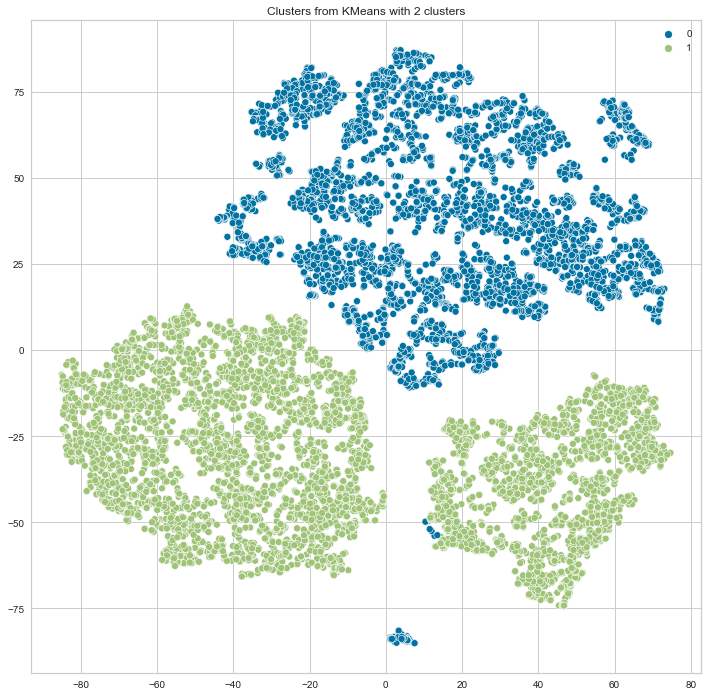

In [62]:
plot_clustering(X_pca3, 2, KMeans)

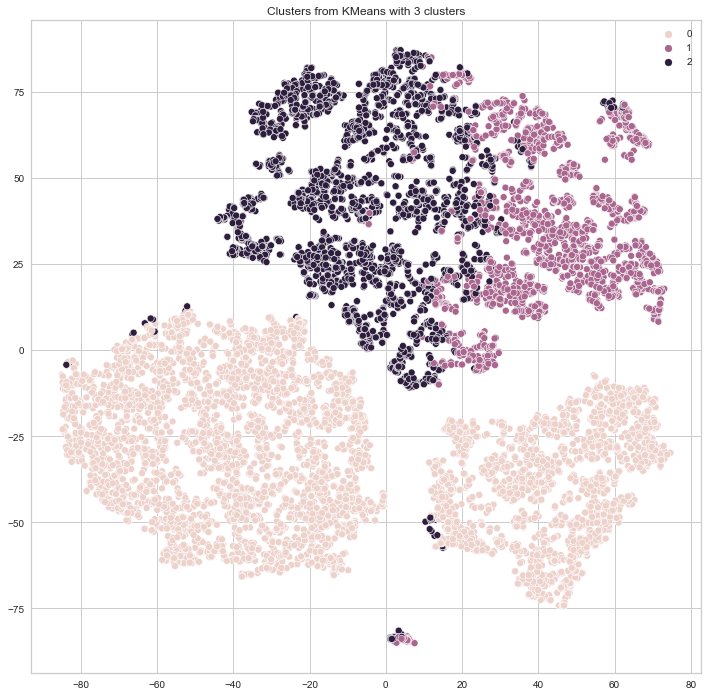

In [68]:
plot_clustering(X_pca3, 3, KMeans)

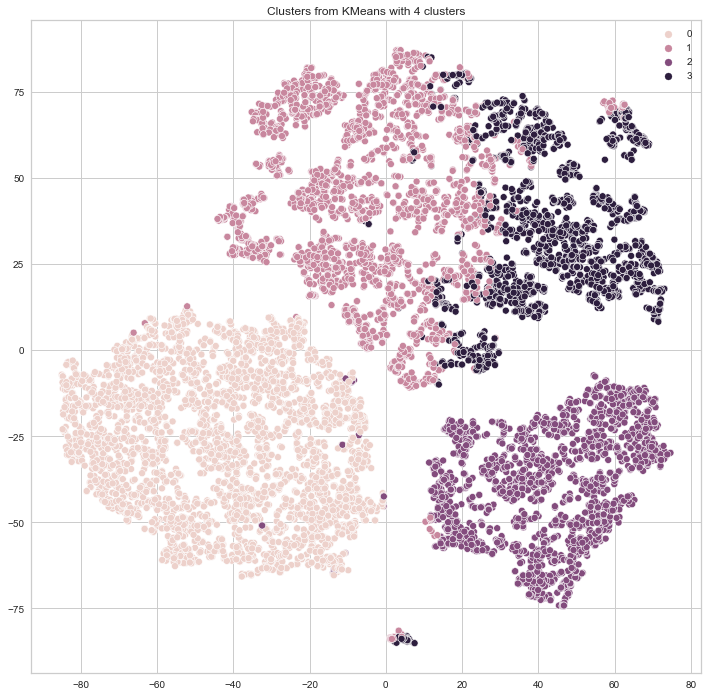

In [69]:
plot_clustering(X_pca3, 4, KMeans)

### Identyfikacja klastrów
#### `k = 2`

In [85]:
preds = KMeans(n_clusters=2, random_state=0).fit(X_pca3).labels_

X_wlabels = pd.DataFrame(X)
X_wlabels['cluster'] = preds

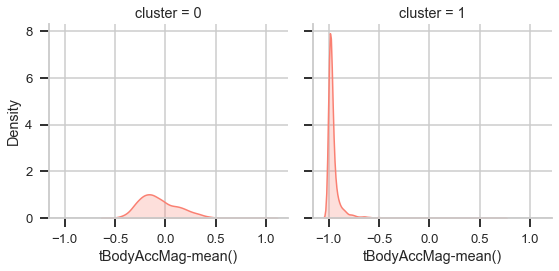

In [88]:
sns.displot(X_wlabels, x="tBodyAccMag-mean()", kind="kde", col="cluster", fill=True, col_wrap=2, color="salmon", height=4)

plt.show()

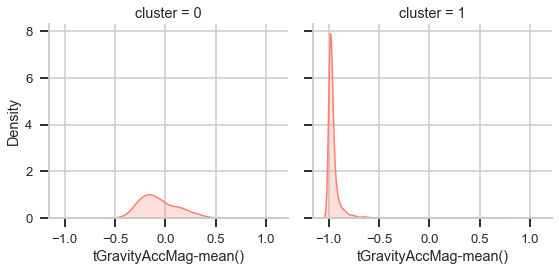

In [89]:
sns.displot(X_wlabels, x="tGravityAccMag-mean()", kind="kde", col="cluster", fill=True, col_wrap=2, color="salmon", height=4)

plt.show()

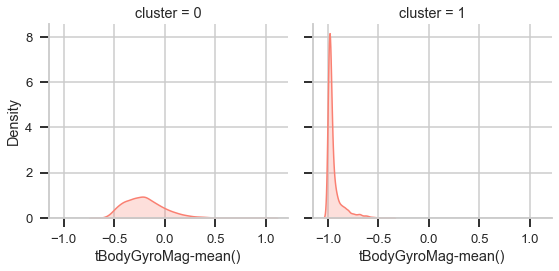

In [91]:
sns.displot(X_wlabels, x="tBodyGyroMag-mean()", kind="kde", col="cluster", fill=True, col_wrap=2, color="salmon", height=4)

plt.show()

Podział na dwa klastry to prawdopodobnie podział na dwa typy aktywności:
- dynamiczne, wymagające sporo ruchu
- stacjonarne, wymagające mało ruchu

#### `k = 4`

In [92]:
preds = KMeans(n_clusters=4, random_state=0).fit(X_pca3).labels_

X_wlabels = pd.DataFrame(X)
X_wlabels['cluster'] = preds

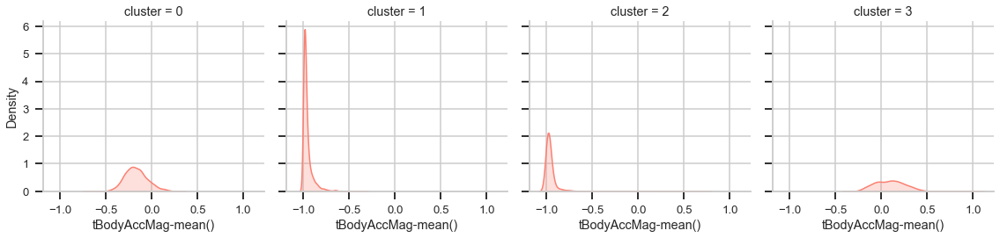

In [93]:
sns.displot(X_wlabels, x="tBodyAccMag-mean()", kind="kde", col="cluster", fill=True, col_wrap=4, color="salmon", height=4)

plt.show()

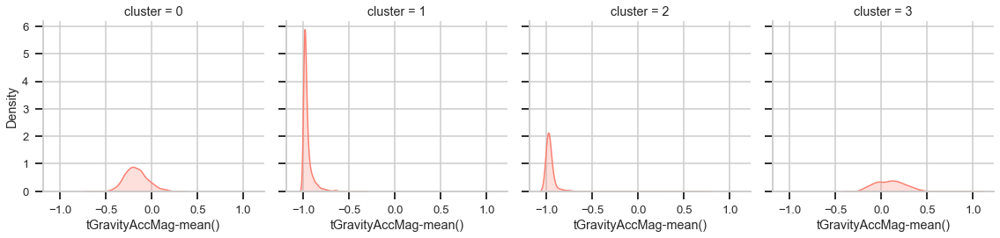

In [94]:
sns.displot(X_wlabels, x="tGravityAccMag-mean()", kind="kde", col="cluster", fill=True, col_wrap=4, color="salmon", height=4)

plt.show()

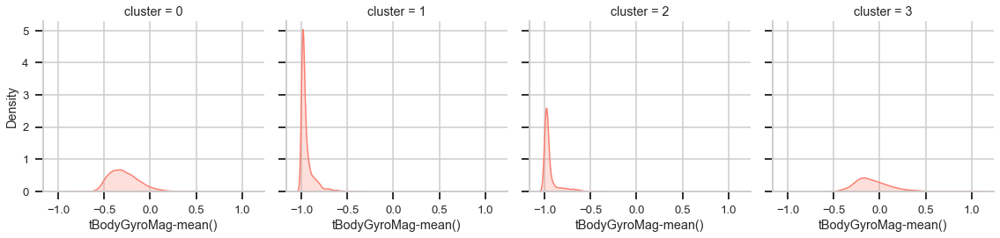

In [96]:
sns.displot(X_wlabels, x="tBodyGyroMag-mean()", kind="kde", col="cluster", fill=True, col_wrap=4, color="salmon", height=4)

plt.show()

W podziale na cztery klastry mamy dwa klastry odpowiadające czynnościom bardziej dynamicznym oraz dwa klastry bardziej czynnościom stacjonarnym.

### Klastrowanie hierarchiczne

In [73]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

#### - PCA 69 components (95% EVR)

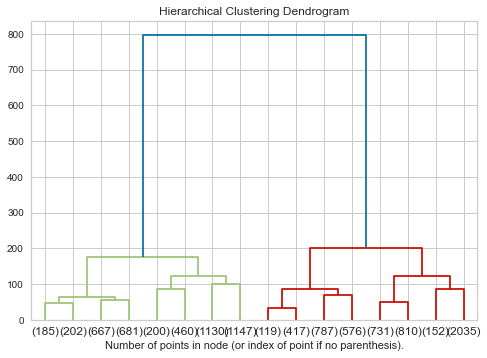

In [77]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X_pca)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

#### - PCA 35 components (90% EVR)

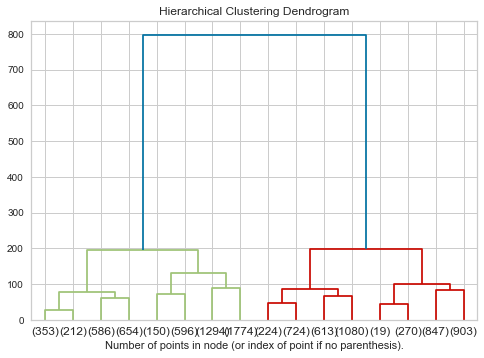

In [78]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X_pca2)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

#### - PCA 11 components (80% EVR)

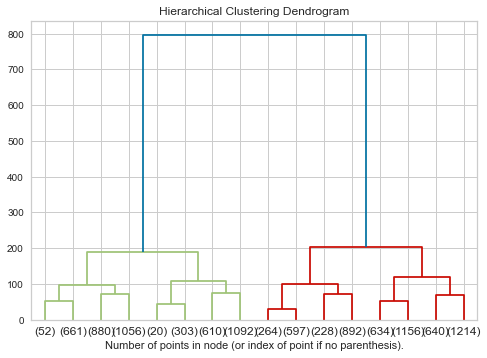

In [79]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X_pca3)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Tutaj również mamy dwa klastry dla wszystkich możliwości PCA.

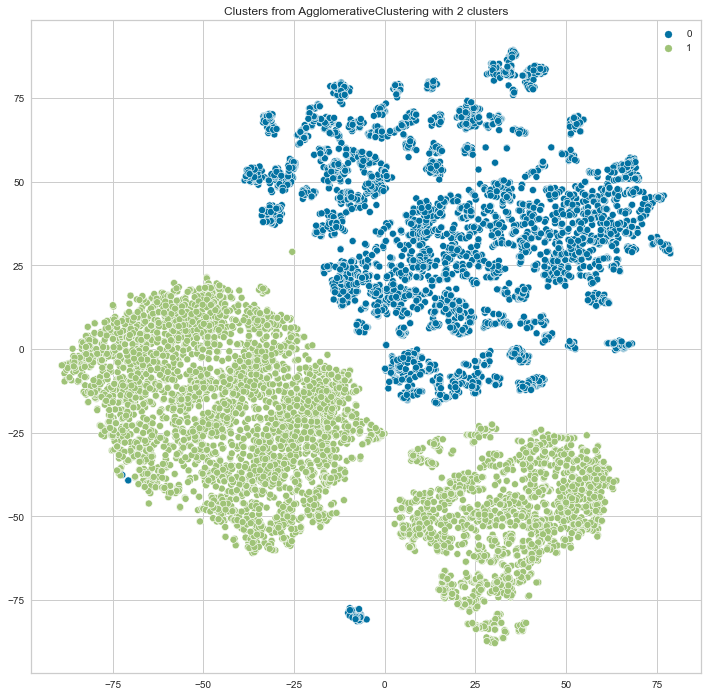

In [81]:
plot_clustering(X_pca2, 2, AgglomerativeClustering)